In [9]:
import os

import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import plotly.express as px
import seaborn as sns
from PIL import Image
from pycocotools import coco
from tqdm.notebook import tqdm
import matplotlib.patches as patches
from ensemble_boxes import *
import subprocess

In [10]:
# argument
model_path = "/opt/ml/baseline/ultralytics/object-detection/206_yolov8n/weights/best.pt"
dataset_path = "/opt/ml/dataset"

In [11]:
import argparse
import os.path as osp

import pandas as pd
import torch
from pycocotools.coco import COCO
from torch.utils.data import DataLoader, Dataset
from tqdm import tqdm
from ultralytics import YOLO


class CustomDataset(Dataset):
    def __init__(self, annotation, data_dir):
        super().__init__()
        self.data_dir = data_dir  # data 경로 폴더
        self.coco = COCO(annotation)  # coco annotation 불러오기 (coco API)

    def __getitem__(self, index: int):
        image_id = self.coco.getImgIds(imgIds=index)
        image_info = self.coco.loadImgs(image_id)[0]
        image = osp.join(self.data_dir, image_info["file_name"])

        return image

    def __len__(self) -> int:
        return len(self.coco.getImgIds())


# 이미지의 예측된 box 얻어서 submission file 내용 만들기
def get_bboxes(data_loader, model):
    # submission 파일에 저장될 내용
    prediction_strings = []
    file_names = []

    for _, image_batch in enumerate(data_loader):
        # 이미지 정보

        with torch.no_grad():
            predictions = model(image_batch)
        batch_size = len(image_batch)
        for idx in range(batch_size):
            file_name = osp.join("test", osp.basename(image_batch[idx]))
            pred_info = predictions[idx].boxes
            classes = pred_info.cls.tolist()
            bboxes = pred_info.xyxy.tolist()
            conf = pred_info.conf.tolist()

            # submission 파일에 저장될 내용
            prediction_string = ""
            for pred_class, conf, box in zip(classes, conf, bboxes):
                prediction_string += (
                    str(int(pred_class))
                    + " "
                    + str(conf)
                    + " "
                    + str(box[0])
                    + " "
                    + str(box[1])
                    + " "
                    + str(box[2])
                    + " "
                    + str(box[3])
                    + " "
                )
            prediction_strings.append(prediction_string)
            file_names.append(file_name)

    return prediction_strings, file_names


seed = 18
torch.manual_seed(seed)

# Hyperparameters etc.
DEVICE = "cuda" if torch.cuda.is_available else "cpu"


def inference():
    # model 생성
    model = YOLO(model_path)
    # inference에 사용할 model 로드

    # annotation 경로
    annotation = "/opt/ml/dataset_yolo/test.json"
    data_dir = "/opt/ml/dataset_yolo"  # dataset 경로

    # 데이터셋 로드
    test_dataset = CustomDataset(annotation, data_dir)
    test_data_loader = DataLoader(test_dataset, batch_size=8, shuffle=False, num_workers=8)
    # 예측 및 submission 파일 생성
    prediction_strings, file_names = get_bboxes(test_data_loader, model)
    submission = pd.DataFrame()
    submission["PredictionString"] = prediction_strings
    submission["image_id"] = file_names
    submission.to_csv(f"/opt/ml/dataset/submission/{model_path.split('/')[-3]}.csv", index=None)
    print(submission.head())


inference()

loading annotations into memory...
Done (t=0.22s)
creating index...
index created!



0: 640x640 2 Papers, 1 Plastic, 8 Plastic bags, 1: 640x640 1 Metal, 2 Plastics, 1 Styrofoam, 2: 640x640 5 Papers, 3: 640x640 2 trashs, 4 Clothings, 4: 640x640 1 Paper, 5: 640x640 1 Paper, 6: 640x640 2 trashs, 2 Glasss, 1 Plastic, 7: 640x640 2 trashs, 2 Papers, 2 Clothings, 23.2ms
Speed: 4.5ms preprocess, 2.9ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 trash, 6 Papers, 7 Plastic bags, 1: 640x640 1 trash, 1 Paper, 2: 640x640 1 Glass, 3: 640x640 1 Metal, 8 Plastics, 1 Styrofoam, 4: 640x640 1 trash, 1 Paper, 1 Plastic bag, 5: 640x640 7 Papers, 6: 640x640 4 Plastic bags, 7: 640x640 1 Plastic bag, 14.0ms
Speed: 4.9ms preprocess, 1.8ms inference, 1.3ms postprocess per image at shape (1, 3, 640, 640)

0: 640x640 1 Paper, 1 Paper pack, 1: 640x640 1 Clothing, 2: 640x640 1 trash, 1 Styrofoam, 1 Plastic bag, 3: 640x640 27 Papers, 2 Styrofoams, 4: 640x640 1 trash, 5: 640x640 1 Paper, 6: 640x640 2 trashs, 7: 640x640 2 Metals, 14.2ms
Speed: 3.8ms preprocess, 1.8m

                                    PredictionString       image_id
0  7 0.9554828405380249 603.3487548828125 516.624...  test/0000.jpg
1  3 0.8522392511367798 331.26165771484375 250.96...  test/0001.jpg
2  1 0.8811900019645691 775.9823608398438 404.266...  test/0002.jpg
3  9 0.7444277405738831 0.0 439.76690673828125 18...  test/0003.jpg
4  1 0.8421834111213684 188.64892578125 256.62374...  test/0004.jpg


In [12]:
print(f"원하는 모델이 선택됐는지 확인해주세요: {model_path.split('/')[-3]}")
df = pd.read_csv(os.path.join(os.path.join(dataset_path, "submission"), f"{model_path.split('/')[-3]}.csv"))

원하는 모델이 선택됐는지 확인해주세요: 206_yolov8n


In [13]:
def normalize_bbox(xmin, ymin, xmax, ymax):
    width = 1024
    height = 1024

    xmin_norm = xmin / width
    ymin_norm = ymin / height
    xmax_norm = xmax / width
    ymax_norm = ymax / height

    return (xmin_norm, ymin_norm, xmax_norm, ymax_norm)


def denormalize_bbox(xmin_norm, ymin_norm, xmax_norm, ymax_norm):
    width = 1024
    height = 1024

    xmin = int(xmin_norm * width)
    ymin = int(ymin_norm * height)
    xmax = int(xmax_norm * width)
    ymax = int(ymax_norm * height)

    return (xmin, ymin, xmax, ymax)

In [14]:
def plot_image(image_path, output, ax):
    classes = [
        "General trash",
        "Paper",
        "Paper pack",
        "Metal",
        "Glass",
        "Plastic",
        "Styrofoam",
        "Plastic bag",
        "Battery",
        "Clothing",
    ]
    image = Image.open(image_path)
    ax.imshow(image)
    for categoty, _, (xmin, ymin, xmax, ymax) in output:
        width = xmax - xmin
        height = ymax - ymin
        rect = patches.Rectangle((xmin, ymin), width, height, linewidth=1, edgecolor="r", facecolor="none")
        ax.add_patch(rect)
        ax.text(xmin, ymin - 10, classes[int(categoty)], fontsize=15, color="r")

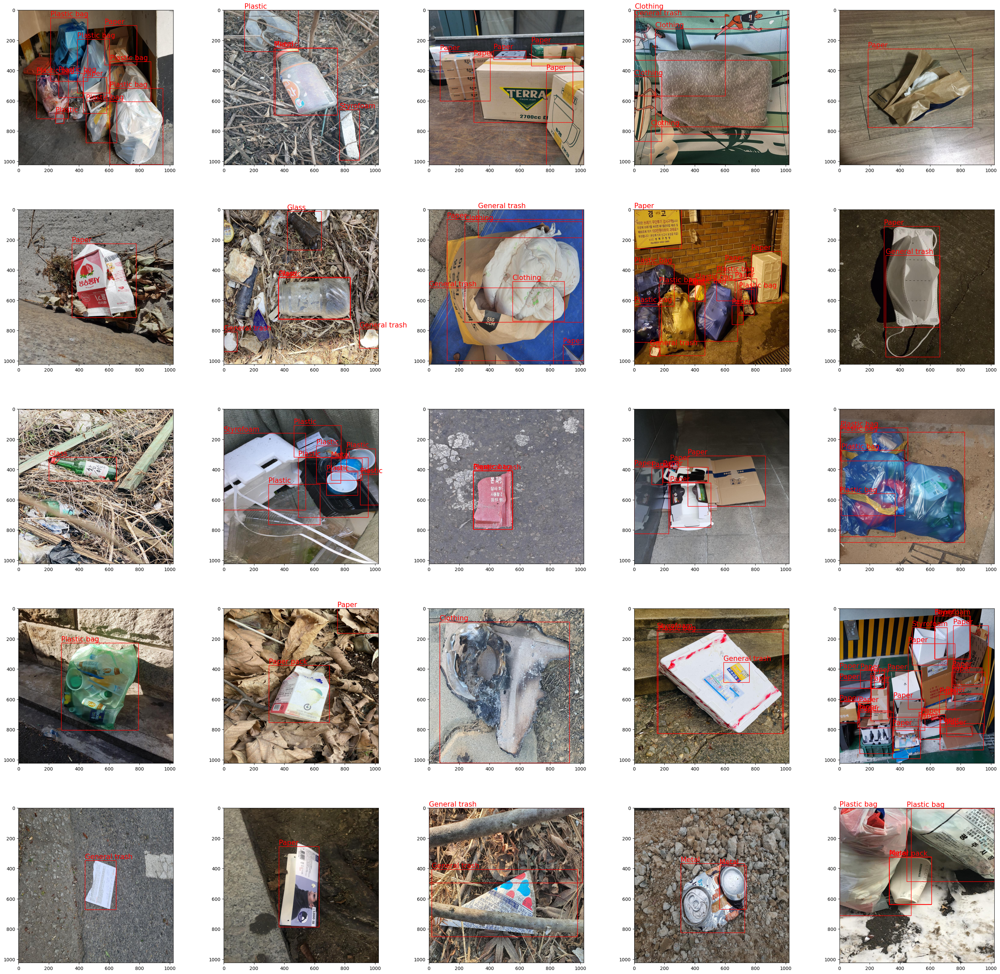

WBF가 box 수를 줄인 사진의 수: 992


In [15]:
_, ax = plt.subplots(5, 5, figsize=(30, 30))
ax = ax.flatten()

prediction_strings = []
file_names = []
count = 0

for j, row in enumerate(df.iterrows()):
    img_path = row[1]["image_id"]

    if not pd.isna(row[1]["PredictionString"]):
        pred_list = row[1]["PredictionString"].split()
        boxes_list, scores_list, labels_list = [], [], []

        for i in range(0, len(pred_list), 6):
            category, score, xmin, ymin, xmax, ymax = map(float, pred_list[i : i + 6])
            boxes_list.append(normalize_bbox(xmin, ymin, xmax, ymax))
            scores_list.append(score)
            labels_list.append(int(category))

        boxes, scores, labels = weighted_boxes_fusion(
            [boxes_list], [scores_list], [labels_list], weights=None, iou_thr=0.5
        )
        boxes = [denormalize_bbox(*box) for box in boxes]
        pred = list(zip(labels, scores, boxes))

        prediction_string = ""
        for label, score, box in pred:
            prediction_string += f"{int(label)} {score} {box[0]} {box[1]} {box[2]} {box[3]} "
        prediction_strings.append(prediction_string)
        file_names.append(img_path)

        if len(boxes_list) != len(boxes):
            count += 1

        if j < 25:
            plot_image(os.path.join(dataset_path, img_path), pred, ax[j])
    else:
        prediction_strings.append("")
        file_names.append(img_path)

plt.tight_layout()
plt.show()

print(f"WBF가 box 수를 줄인 사진의 수: {count}")

In [16]:
submission = pd.DataFrame()
submission["PredictionString"] = prediction_strings
submission["image_id"] = file_names
submission.to_csv(
    os.path.join(os.path.join(dataset_path, "submission"), f"{model_path.split('/')[-3]}_WBF.csv"), index=None
)
display(submission)

,PredictionString,image_id
0,7 0.9554828405380249 603 516 955 1021 7 0.9493...,test/0000.jpg
1,3 0.8522392511367798 331 250 750 694 5 0.73391...,test/0001.jpg
2,1 0.8811900019645691 775 404 1024 1024 1 0.819...,test/0002.jpg
3,9 0.7444277405738831 0 439 181 869 9 0.7322427...,test/0003.jpg
4,1 0.8421834111213684 188 256 879 776,test/0004.jpg
...,...,...
4866,1 0.6678141951560974 288 349 667 685 0 0.58357...,test/4866.jpg
4867,3 0.7661781311035156 415 334 785 706,test/4867.jpg
4868,5 0.39350518584251404 107 425 823 832 7 0.3456...,test/4868.jpg
4869,1 0.7461317777633667 840 0 1024 302 1 0.617251...,test/4869.jpg
